### Importing Libraries 

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


### 1. Loading the Data:

In [3]:
df = pd.read_csv('housing_data.csv')
df.head(4)

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000


### 2. Cleaning the Data:
● Task: Clean the dataset by handling missing values, removing duplicates, and addressing any anomalies.

● Python Library: Pandas

● Explanation: Ensure data quality by eliminating missing values, removing duplicate entries, and addressing any anomalies or inconsistencies in the dataset.

In [4]:
pd.set_option('display.max_column',None)
pd.set_option('display.max_rows',None)

In [5]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
# Checking the shape of dataset : 

print(f'Toatl Rows in dataset is  : {df.shape[0]}')
print(f'Toatl Columns in dataset is  : {df.shape[1]}')

Toatl Rows in dataset is  : 1460
Toatl Columns in dataset is  : 81


In [7]:
## Checking the missing Values :

missing_values = df.isnull().sum()[df.isnull().sum()>0]
missing_per = missing_values/df.shape[0]*100

missing_summary = pd.DataFrame({

    'Missing Value' :   missing_values,
    'Percentage (%)' :  missing_per
})

missing_summary['Percentage (%)'] = missing_summary['Percentage (%)'].round(2)
print('Summary of missing values : \n', missing_summary)

# Checking duplicate values 
duplicate_value =df.duplicated().sum()
print('\n\nNumber of duplioate rows in dataset : ',duplicate_value)



Summary of missing values : 
              Missing Value  Percentage (%)
Alley                 1369           93.77
MasVnrType             872           59.73
Electrical               1            0.07
GarageYrBlt             81            5.55


Number of duplioate rows in dataset :  0


In [8]:
# Making copy of dataset before missing value imputation
df1 = df.copy()

In [9]:
def impute_value(feature,df_old,df_new):
    plt.figure(figsize=(9,4))
    plt.subplot(1,2,1)
    ax = sns.countplot(x=feature,data = df_old,hue=feature,legend=False)
    for i in ax.containers:
        ax.bar_label(i)

    plt.title('Values count before imputation')
    plt.subplot(1,2,2)
    ax= sns.countplot(x=feature,data= df_new,hue=feature,legend=False)
    for i in ax.containers:
        ax.bar_label(i)
    plt.title('Values count after imputation')

    plt.show()

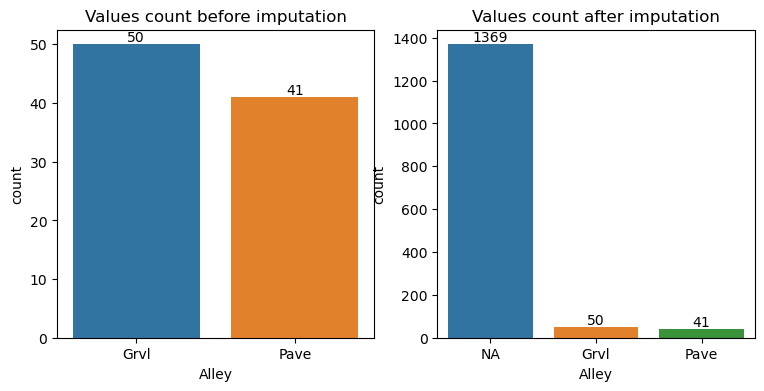

In [10]:
#Handling the missing values for column Alley

feature = 'Alley'
df1[feature].value_counts()

# As per the data dictonary NA refer to no alley access so filling the missing values with NA using fillna .
df1[feature] = df1[feature].fillna('NA')

# Checking with visuals of missing values before and after imputation

impute_value(feature,df,df1)


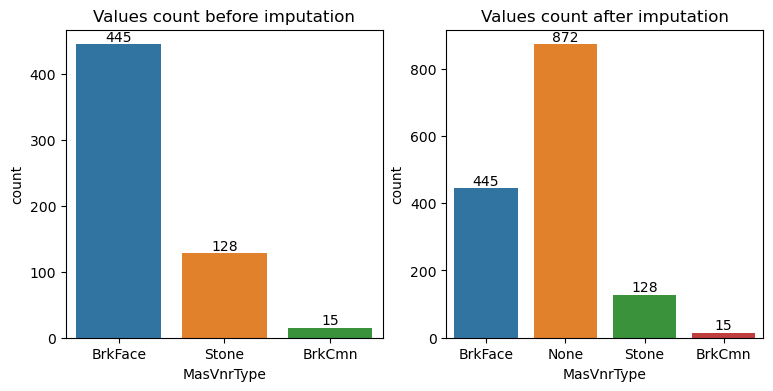

In [11]:
# Handling the missing values for column MasVnrType  
feature = 'MasVnrType'
df1['MasVnrType'].value_counts()

# As per the data dictonary none refer to no Masonry veneer type so filling the missing values with 'None' using fillna .

df1['MasVnrType'] = df1['MasVnrType'].fillna('None')
impute_value(feature,df,df1)
   
        

#### #Handling the missing values for column Electrical

In [12]:
# Only 1 value is missing in this feature, filling with most repeated value using mode()

df1['Electrical'] = df1['Electrical'].fillna(df1['Electrical'].mode()[0])
df1['Electrical'].value_counts()


Electrical
SBrkr    1335
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: count, dtype: int64

#### #Handling the missing values for column GarageYrBlt

In [13]:
# 81 value is missing in this feature. GarageYrBlt is dependent to other column GarageType, if there is no garage then means year of built will be null. filling the missing value with 0. 

print('Total missing values : ',df1['GarageYrBlt'].isnull().sum())
df1['GarageType'].value_counts()

print('Count of value with no garage',df1['GarageType'].value_counts()['No'])


filter_value =  df1[['GarageType','GarageYrBlt']].loc[df1['GarageYrBlt'].isnull()]
filter_value



Total missing values :  81
Count of value with no garage 81


,GarageType,GarageYrBlt
39,No,NaN
48,No,NaN
78,No,NaN
88,No,NaN
89,No,NaN
99,No,NaN
108,No,NaN
125,No,NaN
127,No,NaN
140,No,NaN


In [14]:
#Filling values with 0 (zero)
df1['GarageYrBlt'] = df1['GarageYrBlt'].fillna(0)

In [15]:
# Checking the presence of null values 

df1.isnull().sum()[df1.isnull().sum()>0]


Series([], dtype: int64)

### Other Anamolies

In [16]:
#df1= df1.drop('Unnamed: 0',axis=1)
df1_cat_feature = df1.select_dtypes(include='O')
for col in df1_cat_feature.columns.tolist():
    print(f"{col}:\t {list(df1[col].unique())}")  # Access each column individually

MSSubClass:	 ['SC60', 'SC20', 'SC70', 'SC50', 'SC190', 'SC45', 'SC90', 'SC120', 'SC30', 'SC85', 'SC80', 'SC160', 'SC75', 'SC180', 'SC40']
MSZoning:	 ['RL', 'RM', 'C (all)', 'FV', 'RH']
Street:	 ['Pave', 'Grvl']
Alley:	 ['NA', 'Grvl', 'Pave']
LotShape:	 ['Reg', 'IR1', 'IR2', 'IR3']
LandContour:	 ['Lvl', 'Bnk', 'Low', 'HLS']
Utilities:	 ['AllPub', 'NoSeWa']
LotConfig:	 ['Inside', 'FR2', 'Corner', 'CulDSac', 'FR3']
LandSlope:	 ['Gtl', 'Mod', 'Sev']
Neighborhood:	 ['CollgCr', 'Veenker', 'Crawfor', 'NoRidge', 'Mitchel', 'Somerst', 'NWAmes', 'OldTown', 'BrkSide', 'Sawyer', 'NridgHt', 'NAmes', 'SawyerW', 'IDOTRR', 'MeadowV', 'Edwards', 'Timber', 'Gilbert', 'StoneBr', 'ClearCr', 'NPkVill', 'Blmngtn', 'BrDale', 'SWISU', 'Blueste']
Condition1:	 ['Norm', 'Feedr', 'PosN', 'Artery', 'RRAe', 'RRNn', 'RRAn', 'PosA', 'RRNe']
Condition2:	 ['Norm', 'Artery', 'RRNn', 'Feedr', 'PosN', 'PosA', 'RRAn', 'RRAe']
BldgType:	 ['1Fam', '2fmCon', 'Duplex', 'TwnhsE', 'Twnhs']
HouseStyle:	 ['2Story', '1Story', '1.5F

In [17]:
df1_num_feature = df1.select_dtypes('int64','Float64')
df1_num_feature.describe()

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,729.500000,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,2007.815753,180921.195890
std,421.610009,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,1.328095,79442.502883
min,0.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000
25%,364.750000,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129975.000000
50%,729.500000,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,163000.000000
75%,1094.250000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000,214000.000000
max,1459.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,2010.000000,755000.000000


### No anamolies found 
All the numerical values categorized under int64 and Float64 datatype and all categorirical values categotrized under object datatype

No duplicate value available. 

All the missing values imputed. 

________________________________________________________________________________________________________________________________

### 3. Univariate Analysis:
● Task: Explore individual variables to understand their distributions and characteristics.

● Python Library: Matplotlib, Seaborn

● Explanation: Conduct a univariate analysis to understand the distribution of key variables like house prices. Utilize histograms, kernel density plots, or other visualizations to gain insights into the data.

### Univariate Analysis of numerical features

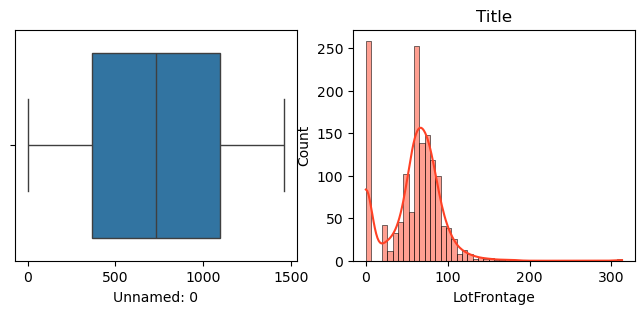

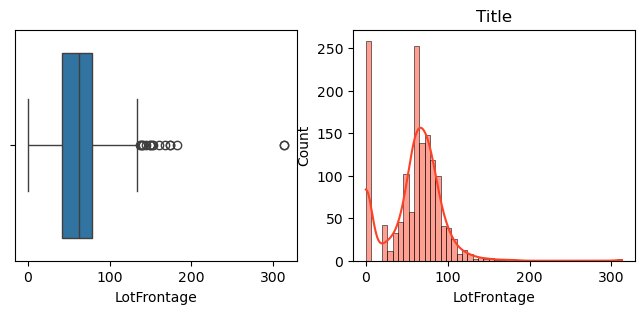

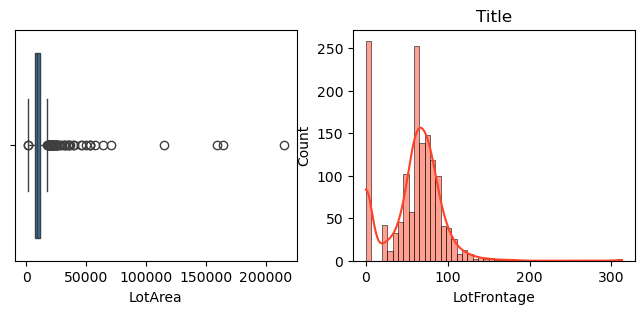

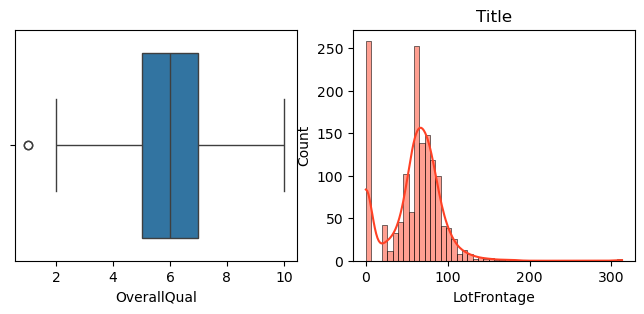

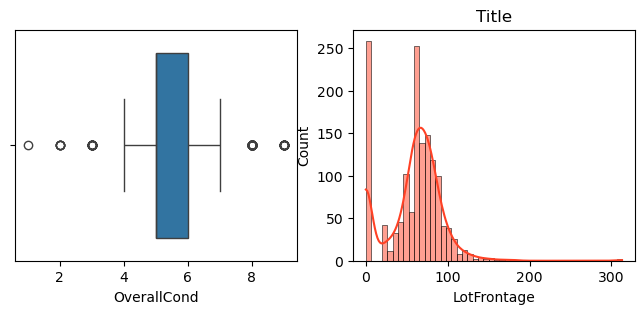

...

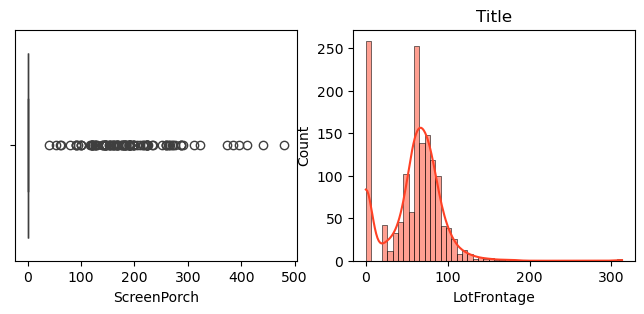

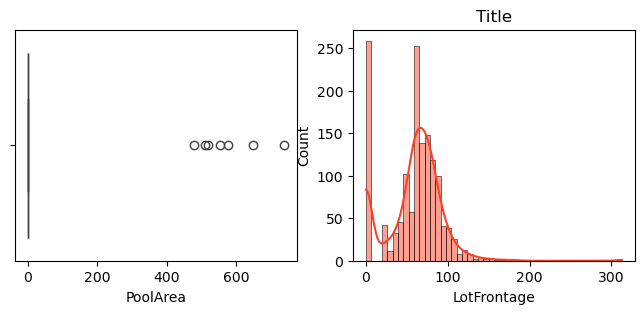

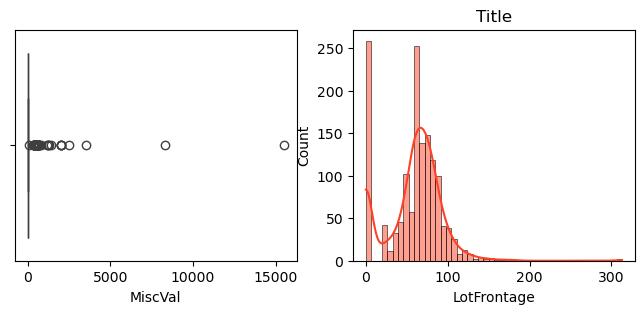

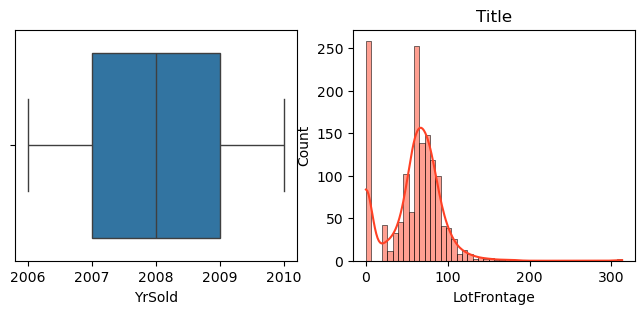

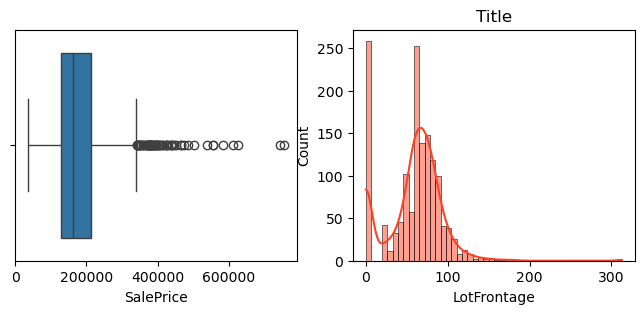

In [18]:


def plot_num(feature,df):
    plt.figure(figsize=(8,3))
    plt.subplot(1,2,1)
    sns.boxplot(data= df, x = feature)
    plt.subplot(1,2,2)
    sns.histplot(data=df,x='LotFrontage',kde=True,color='#ff4125')
    plt.title('Title')
    plt.show()

for i,col in enumerate(df1_num_feature):
    plot_num(col,df1_num_feature)
    

### Univariate Analysis of Categorical Feature

Most frequent category MSSubClass: SC20


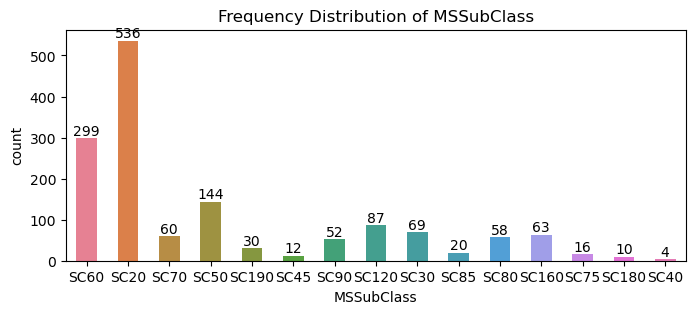

Most frequent category MSZoning: RL


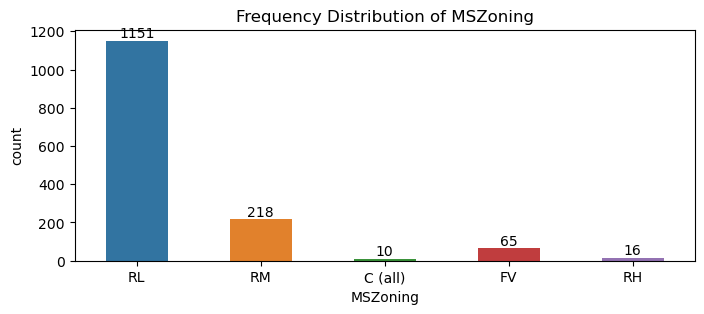

Most frequent category Street: Pave


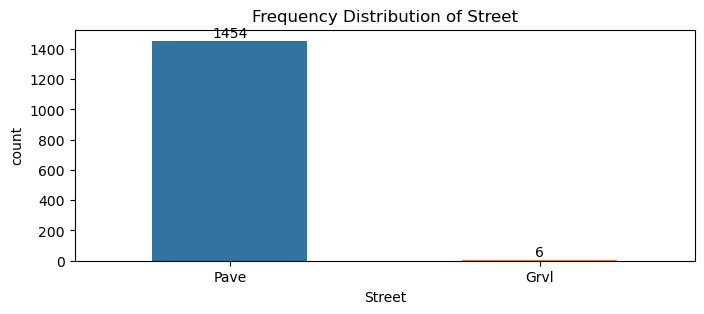

Most frequent category Alley: Grvl


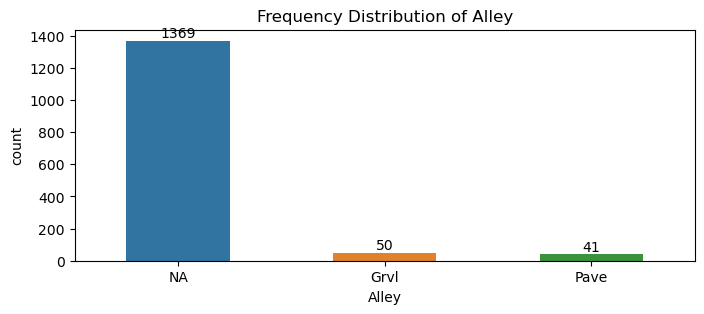

Most frequent category LotShape: Reg


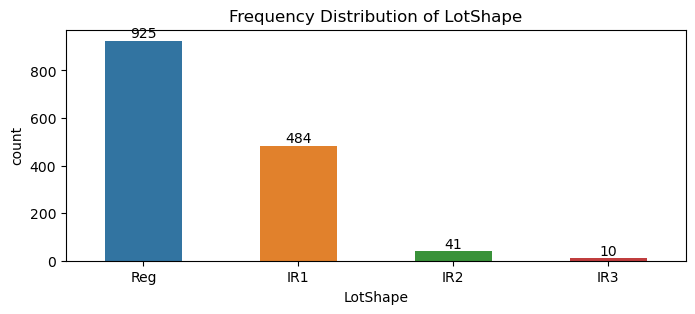

Most frequent category LandContour: Lvl


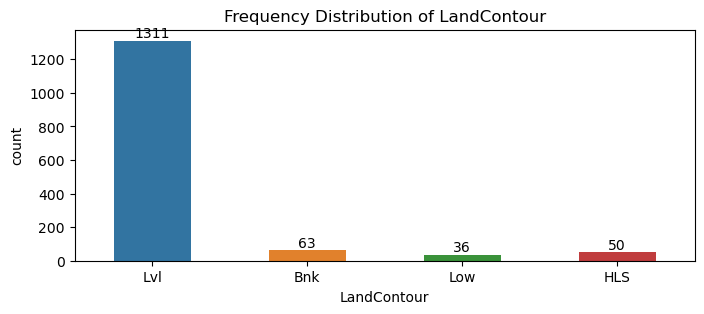

Most frequent category Utilities: AllPub


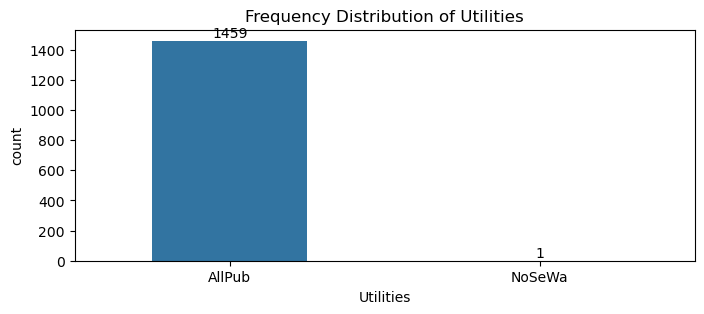

Most frequent category LotConfig: Inside


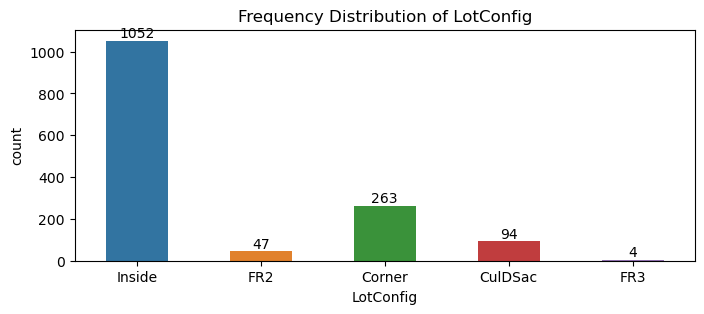

Most frequent category LandSlope: Gtl


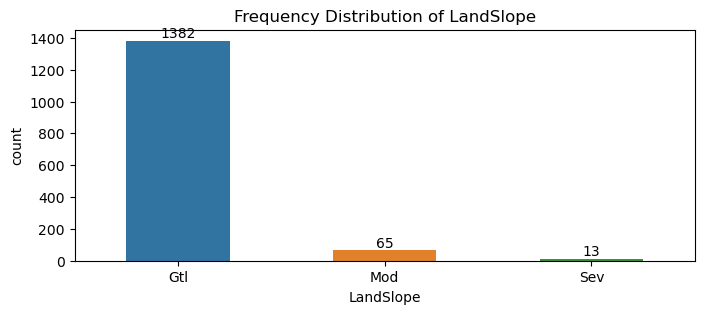

Most frequent category Neighborhood: NAmes


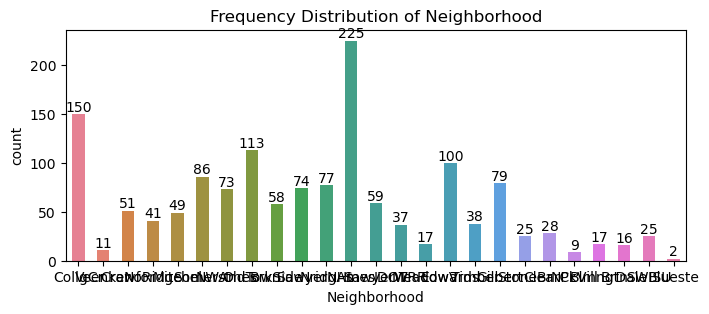

Most frequent category Condition1: Norm


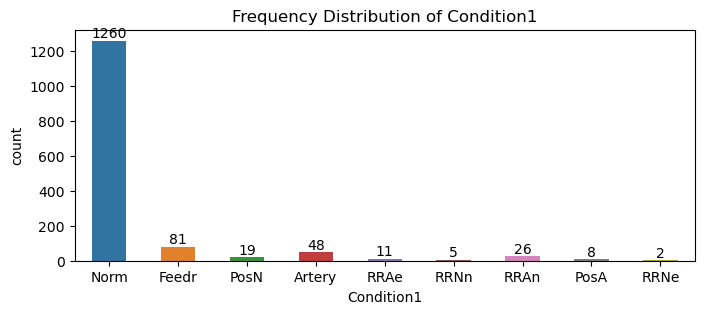

Most frequent category Condition2: Norm


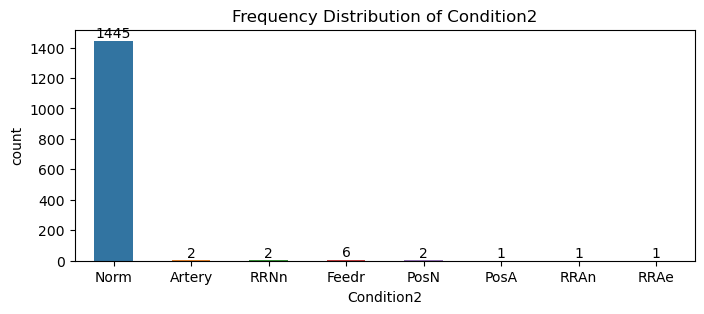

Most frequent category BldgType: 1Fam


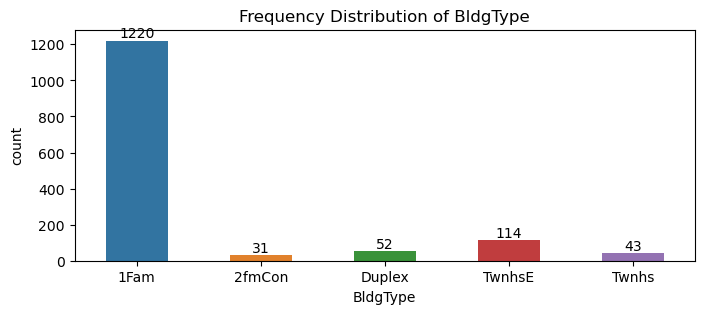

Most frequent category HouseStyle: 1Story


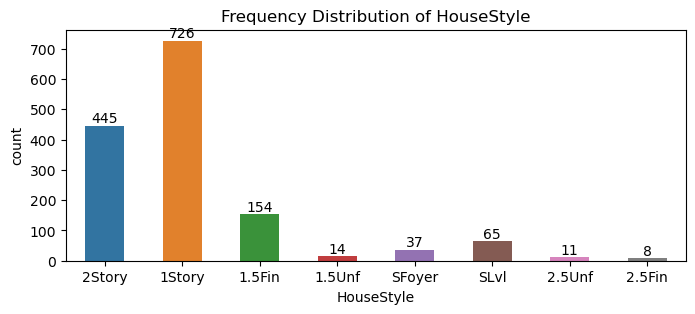

Most frequent category RoofStyle: Gable


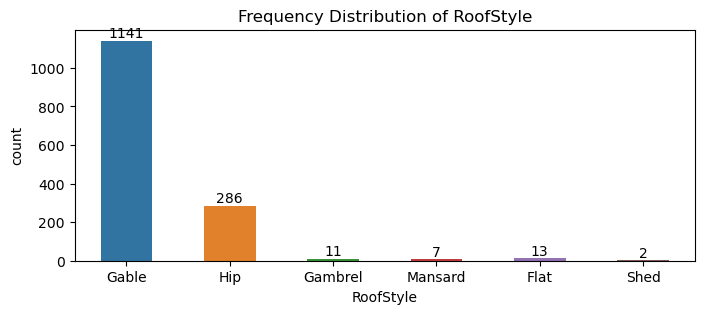

Most frequent category RoofMatl: CompShg


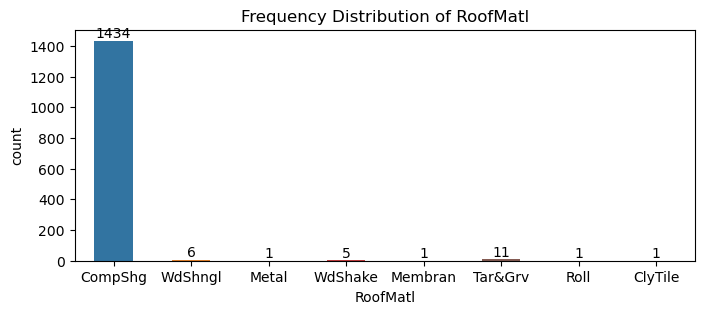

Most frequent category Exterior1st: VinylSd


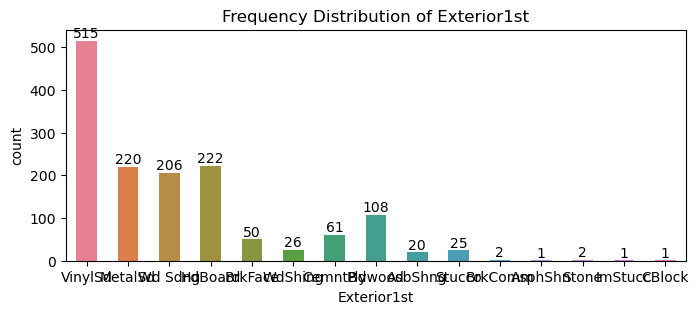

Most frequent category Exterior2nd: VinylSd


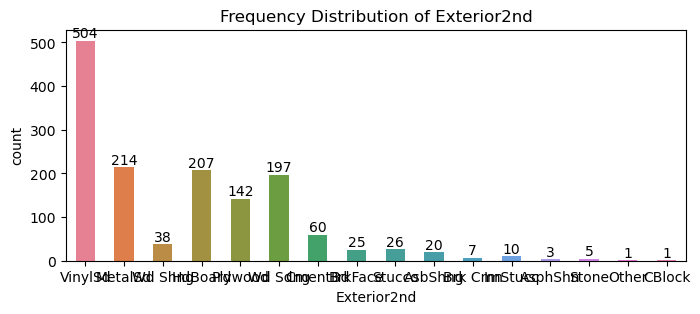

Most frequent category MasVnrType: BrkFace


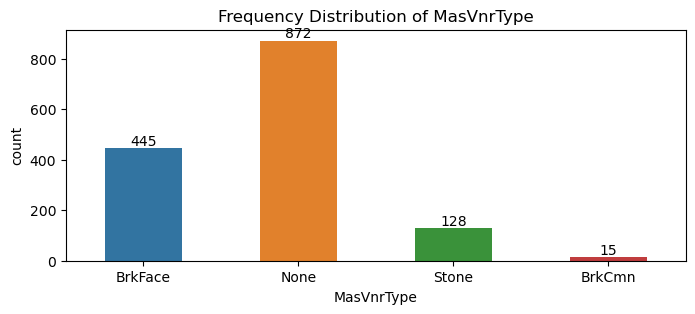

Most frequent category ExterQual: TA


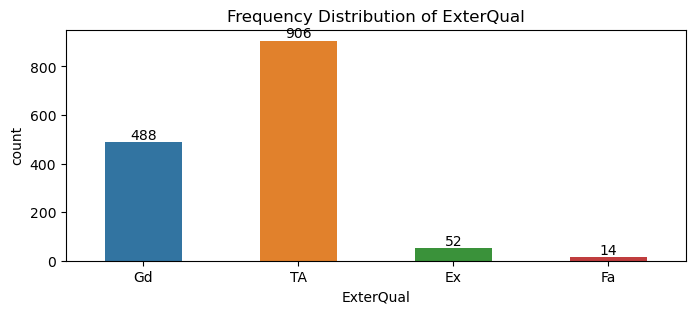

Most frequent category ExterCond: TA


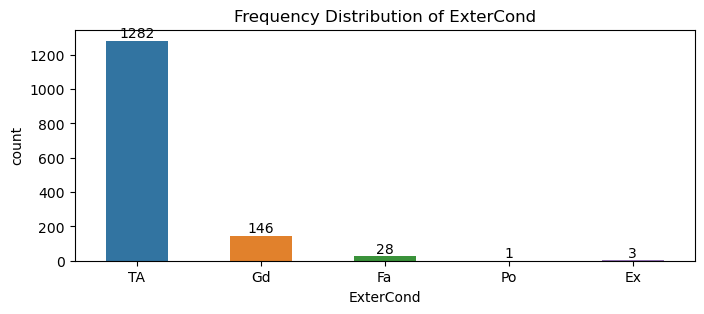

Most frequent category Foundation: PConc


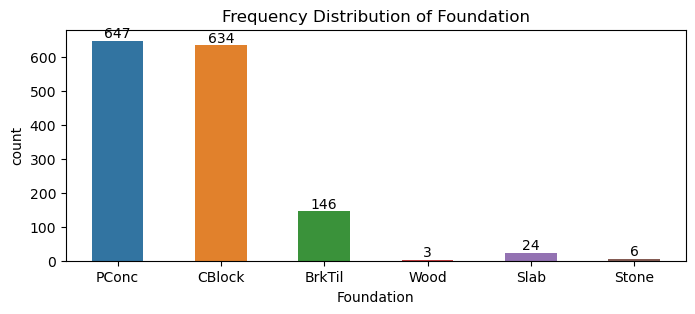

Most frequent category BsmtQual: TA


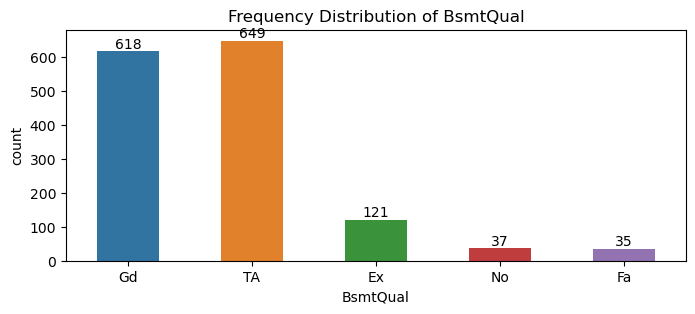

Most frequent category BsmtCond: TA


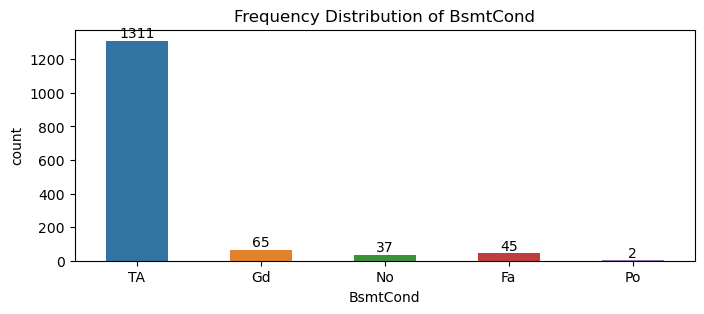

Most frequent category BsmtExposure: No


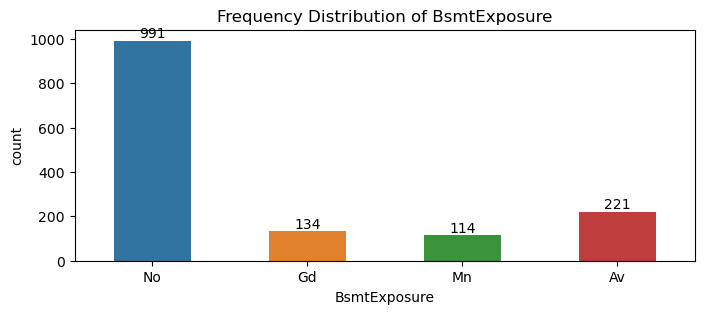

Most frequent category BsmtFinType1: Unf


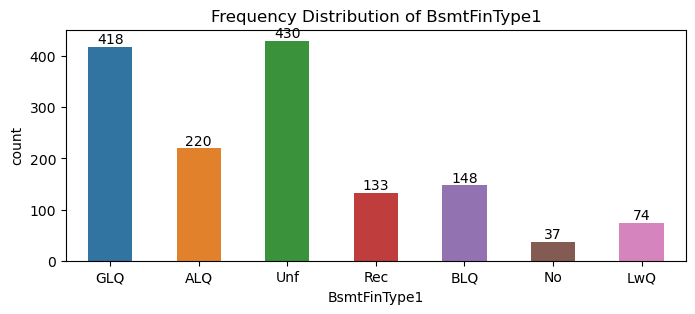

Most frequent category BsmtFinType2: Unf


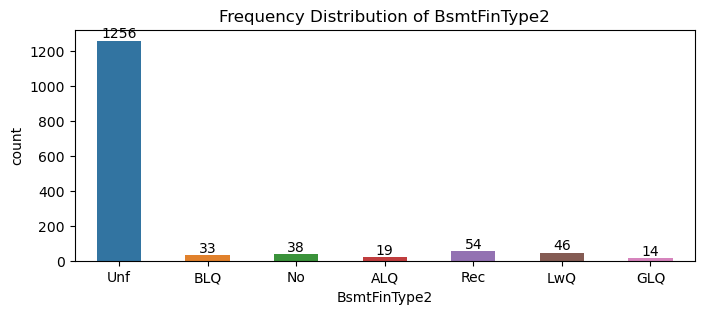

Most frequent category Heating: GasA


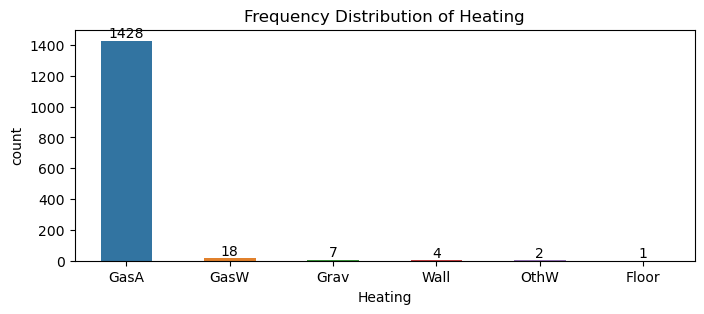

Most frequent category HeatingQC: Ex


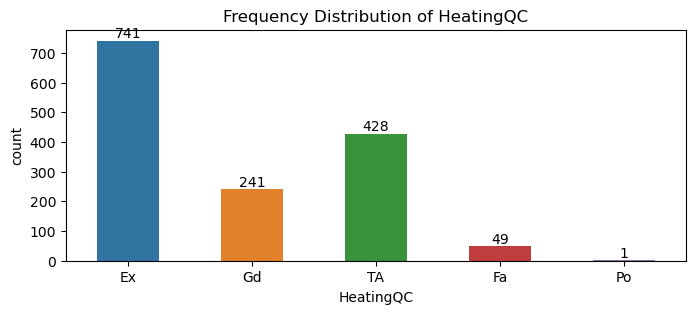

Most frequent category CentralAir: Y


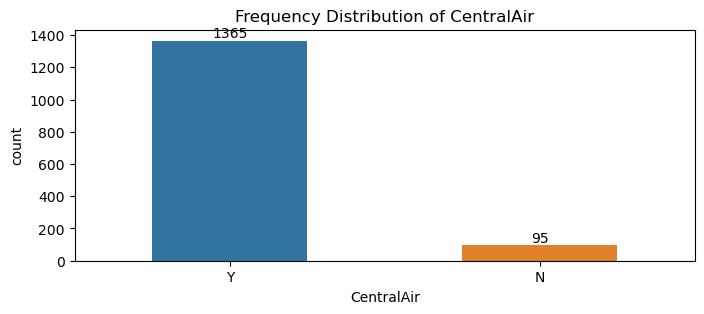

Most frequent category Electrical: SBrkr


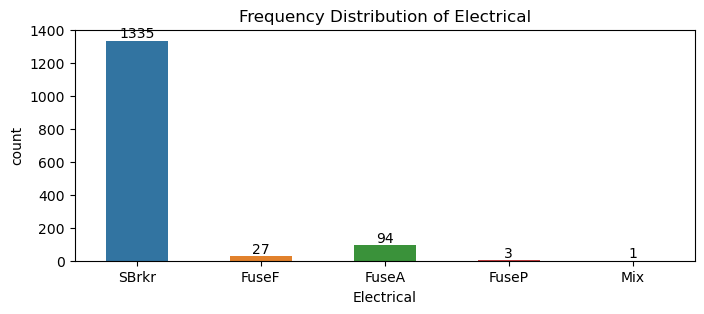

Most frequent category KitchenQual: TA


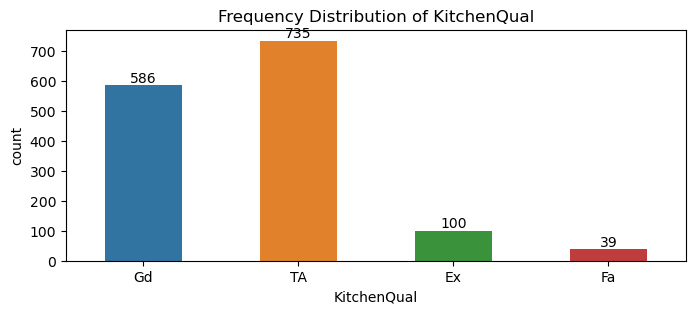

Most frequent category Functional: Typ


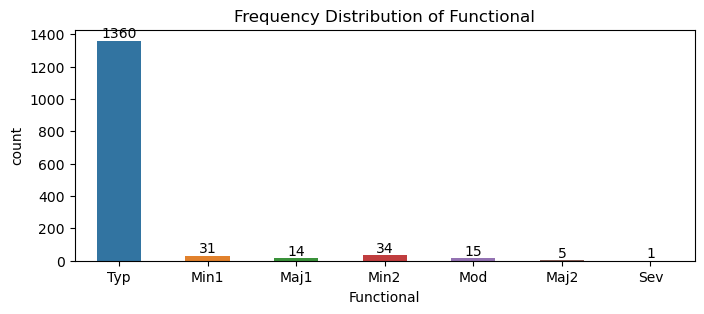

Most frequent category FireplaceQu: No


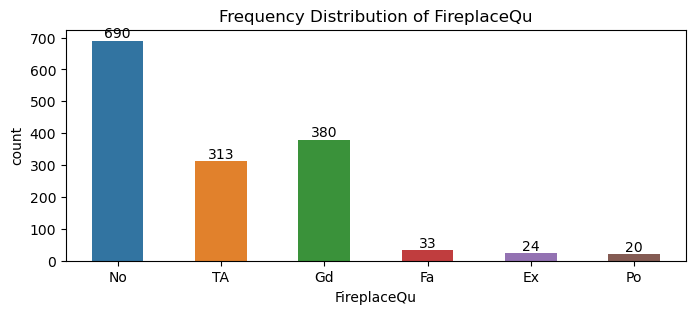

Most frequent category GarageType: Attchd


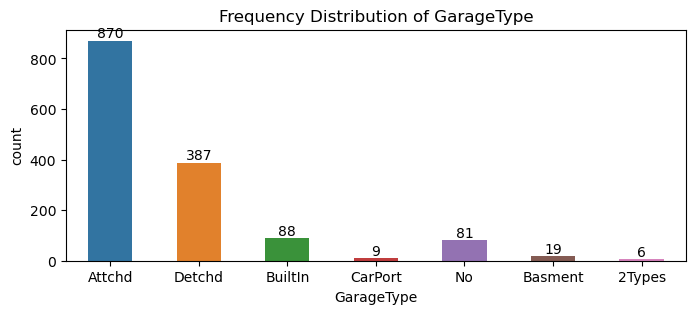

Most frequent category GarageFinish: Unf


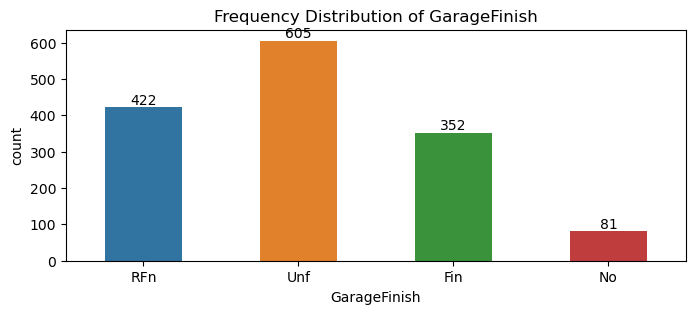

Most frequent category GarageQual: TA


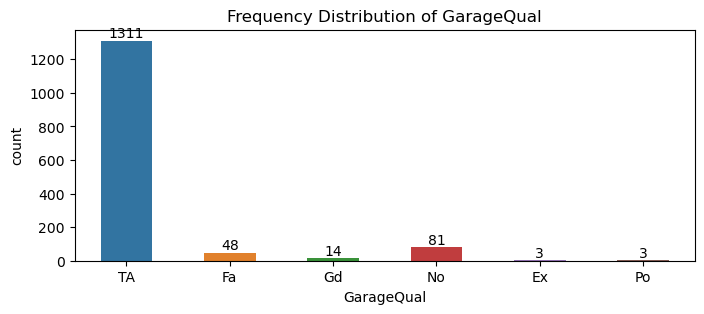

Most frequent category GarageCond: TA


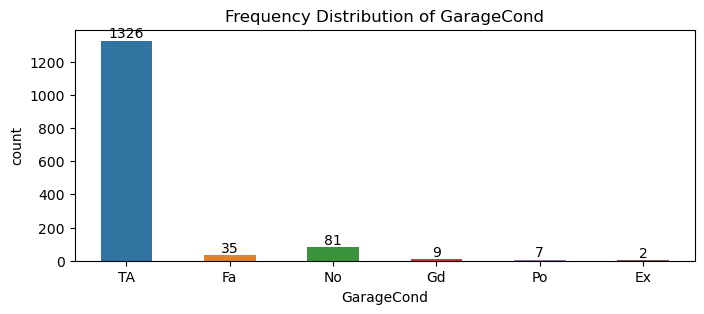

Most frequent category PavedDrive: Y


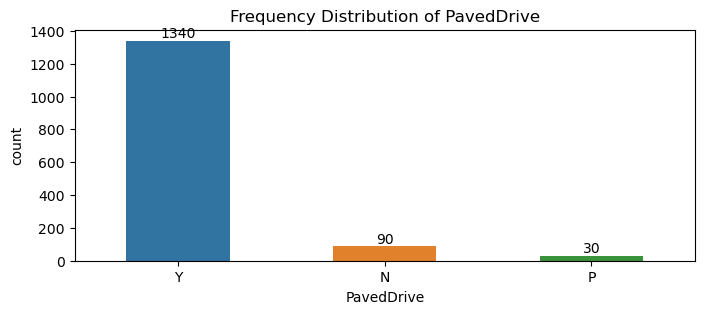

Most frequent category PoolQC: No


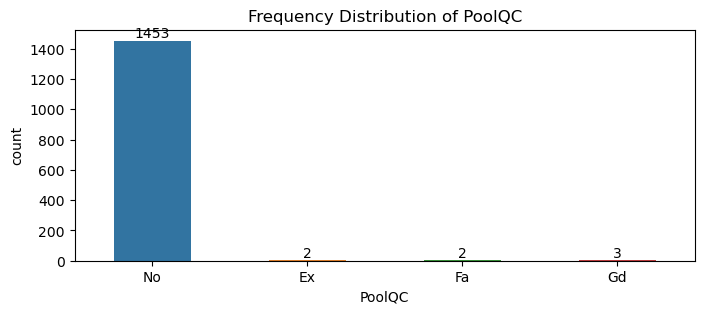

Most frequent category Fence: No


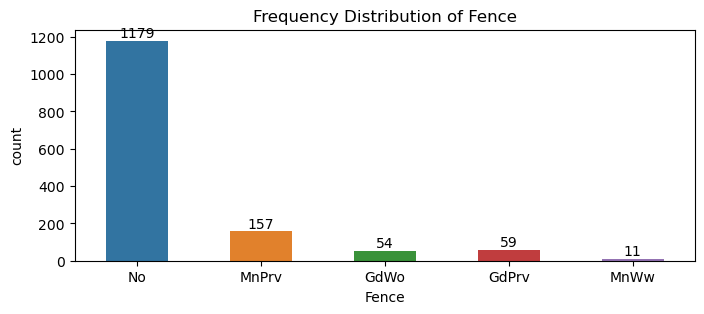

Most frequent category MiscFeature: No


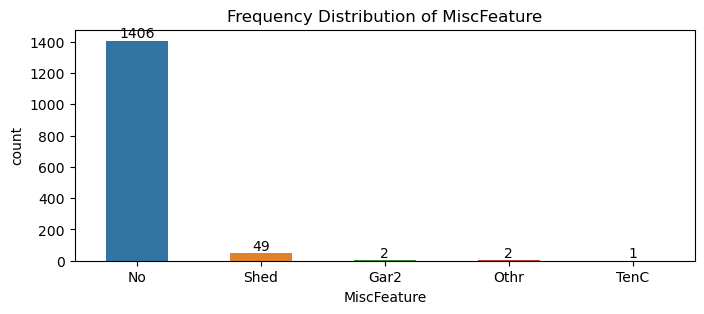

Most frequent category MoSold: Jun


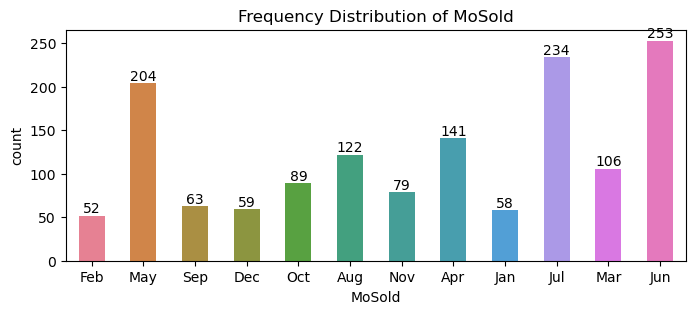

Most frequent category SaleType: WD


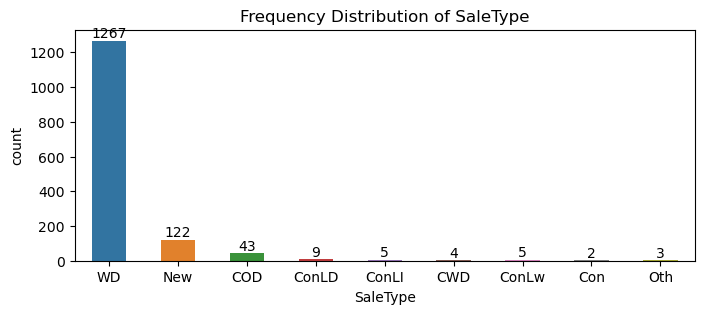

Most frequent category SaleCondition: Normal


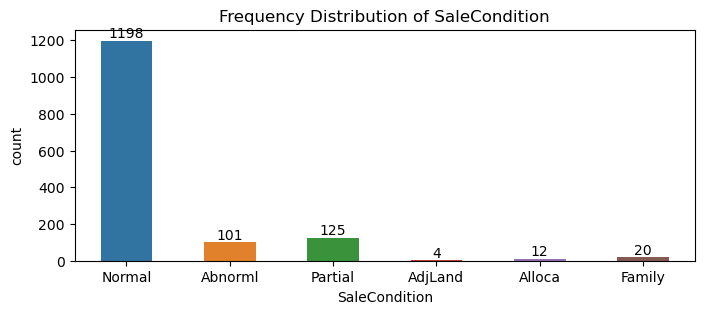

In [19]:

def plot_cat(feature,df):
    plt.figure(figsize=(8, 3))

    ax = sns.countplot(data=df,x=feature,width=0.5,hue=feature)
    for i in ax.containers:
        ax.bar_label(i)
    plt.title(f'Frequency Distribution of {col}')
    plt.show()
    

df1_cat_feature


for i,col in enumerate(df1_cat_feature):
    mode_value = df[col].mode()[0]
    print(f"Most frequent category {col}: {mode_value}")
    plot_cat(col,df1_cat_feature)




### 4. Multivariate Analysis:
● Task: Investigate relationships between multiple variables, especially those impacting house prices.

● Python Library: Matplotlib, Seaborn

● Explanation: Perform multivariate analysis to understand the correlations and dependencies between various features. Utilize techniques like correlation matrices or scatterplot matrices for a comprehensive view.

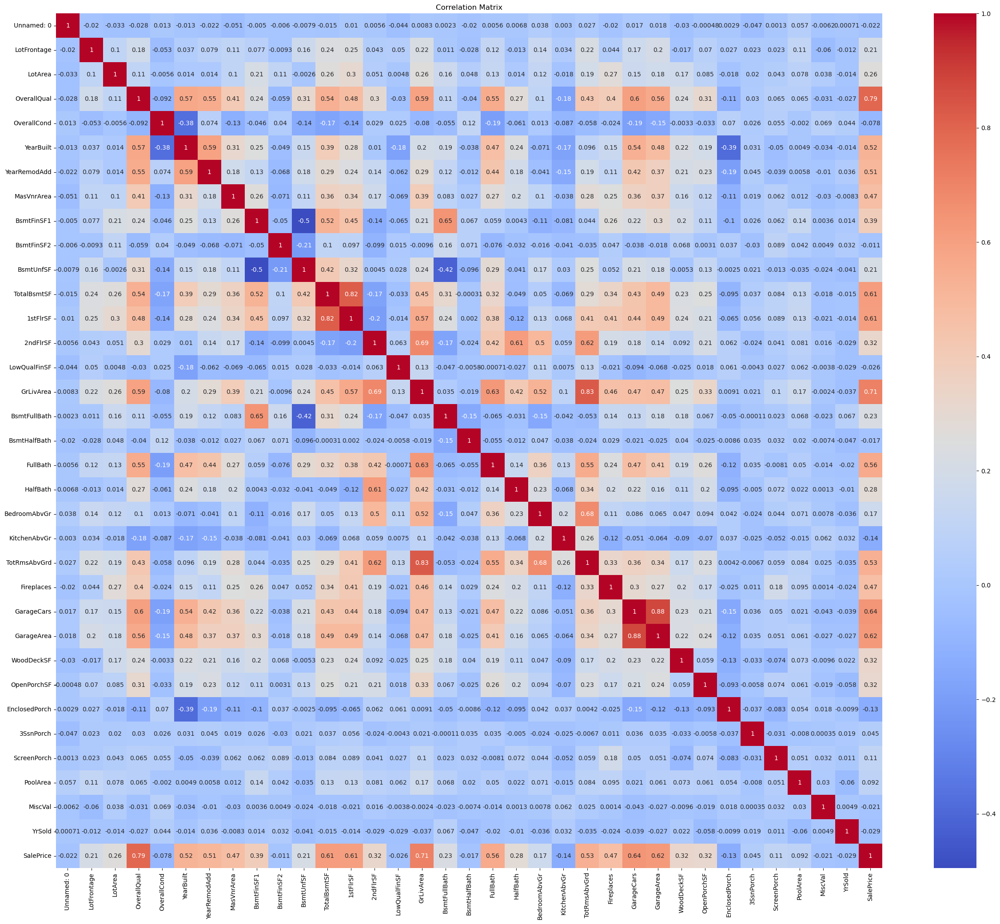

In [20]:
plt.figure(figsize=(30,25))
correlation_matrix = df1_num_feature.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

Index(['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
       'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt',
       'YearRemodAdd'],
      dtype='object')


<Axes: >

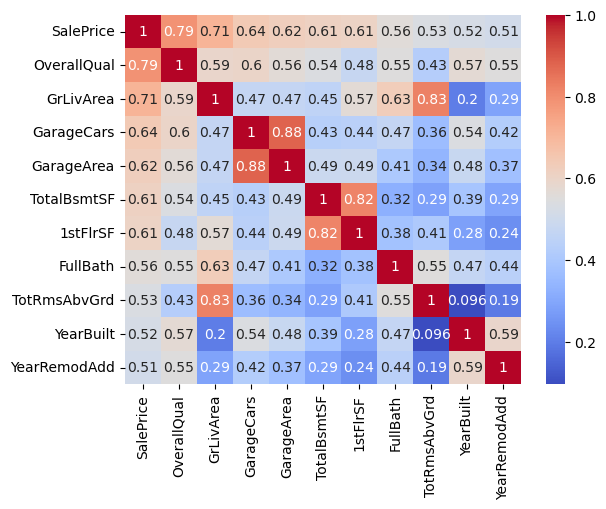

In [21]:
#Checking the top correleted feature >0.5


correlation_with_saleprice = df1_num_feature.corr()['SalePrice'].sort_values(ascending=False)
correlation_with_saleprice_morethan_5 = correlation_with_saleprice[correlation_with_saleprice>0.5].keys()
print(correlation_with_saleprice_morethan_5)


a = df1_num_feature[correlation_with_saleprice_morethan_5].corr()#[df1_num_feature.corr()>0.5]
sns.heatmap(a,annot=True,cmap='coolwarm')

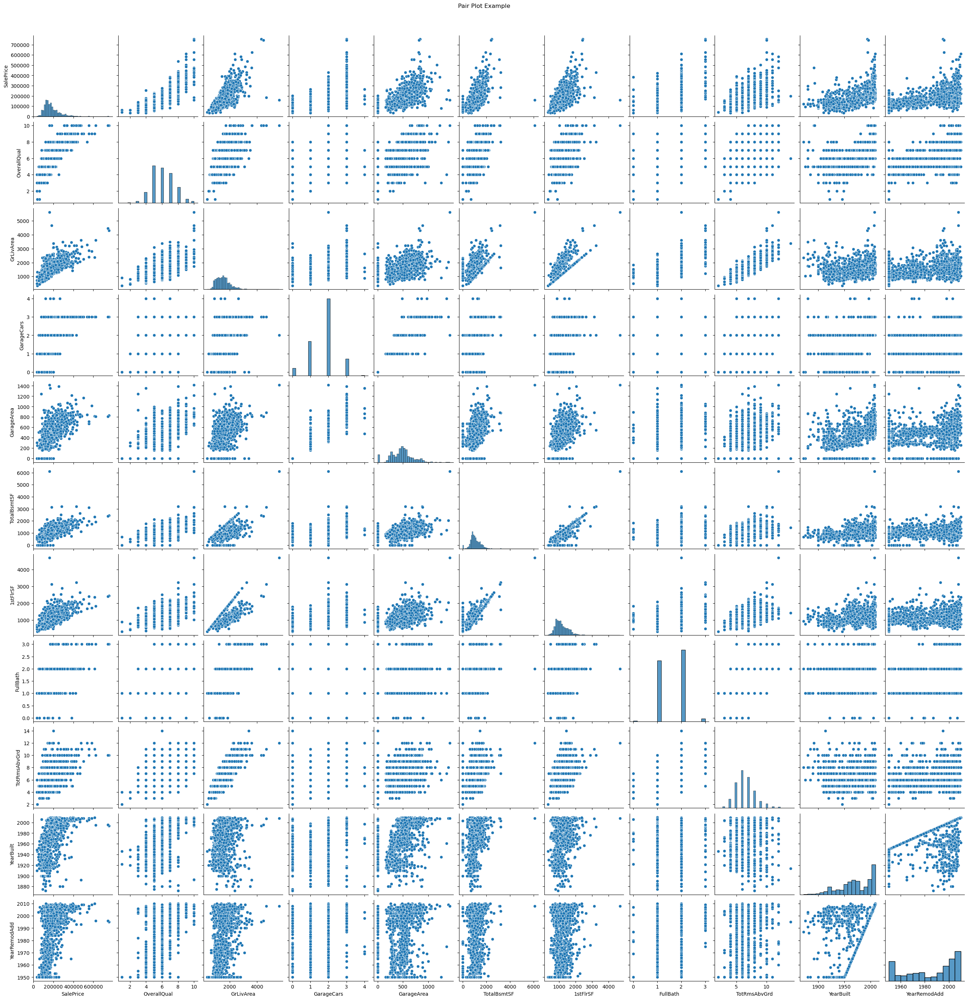

In [22]:
#plotting values in pair plot 


sns.pairplot(df1_num_feature, vars=list(correlation_with_saleprice_morethan_5))
plt.suptitle('Pair Plot Example', y=1.02)
plt.show()

<Axes: xlabel='YearRemodAdd', ylabel='SalePrice'>

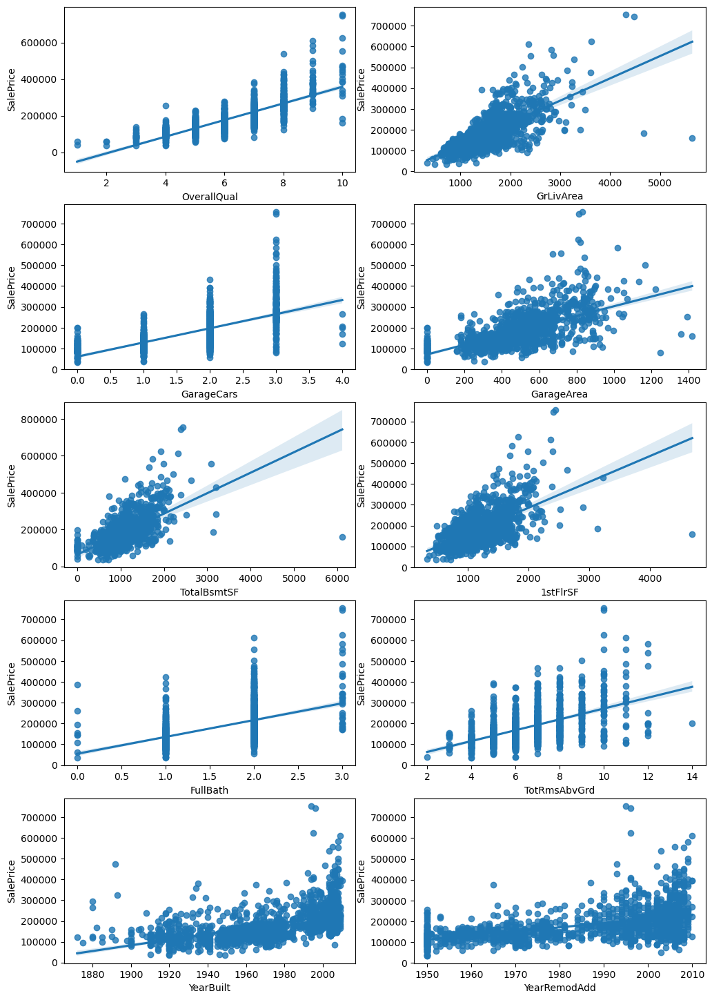

In [23]:
fig,((ax1,ax2),(ax3,ax4),(ax5,ax6),(ax7,ax8),(ax9,ax10))=plt.subplots(nrows=5,ncols=2,figsize=(12,18))
sns.regplot(x='OverallQual',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax1)
sns.regplot(x='GrLivArea',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax2)
sns.regplot(x='GarageCars',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax3)
sns.regplot(x='GarageArea',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax4)
sns.regplot(x='TotalBsmtSF',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax5)
sns.regplot(x='1stFlrSF',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax6)                                               
sns.regplot(x='FullBath',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax7)                                               
sns.regplot(x='TotRmsAbvGrd',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax8)                                               
sns.regplot(x='YearBuilt',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax9)                                               
sns.regplot(x='YearRemodAdd',y='SalePrice',data=df1_num_feature,scatter=True,fit_reg=True,ax=ax10)                                               

### 5. Feature Engineering:

● Task: Create new features that capture relevant information for pricing analysis.

● Python Library: Pandas

● Explanation: Introduce new variables that might enhance the model's ability to predict house prices. For instance, calculate the price per square foot or engineer a feature representing the property's age.

In [24]:
# Creating backup of dataset. Will use new copy of dataset for further operation so previous changes done in dataset will remain as backup copy.

df2 = df1.copy()

### Adding new column:[Property_age],[Price_persqrft] = price per square foot,[Total_bathroom]


In [25]:
df2['Property_Age'] = df2['YrSold']- df2['YearBuilt']
df2.head(3)

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Property_Age
0,0,SC60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500,5
1,1,SC20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500,31
2,2,SC60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500,7


In [26]:
df2['Price_persqrft'] = df2['SalePrice']/df2['LotArea']
df2

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Property_Age,Price_persqrft
0,0,SC60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500,5,24.674556
1,1,SC20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500,31,18.906250
2,2,SC60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500,7,19.866667
3,3,SC70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000,91,14.659686
4,4,SC60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000,8,17.531557
5,5,SC50,RL,85,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,No,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,No,MnPrv,Shed,700,Oct,2009,WD,Normal,143000,16,10.131066
6,6,SC20,RL,75,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,307000,3,30.444268
7,7,SC60,RL,0,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,No,No,Shed,350,Nov,2009,WD,Normal,200000,36,19.264111
8,8,SC50,RM,51,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,No,No,No,0,Apr,2008,WD,Abnorml,129900,77,21.225490
9,9,SC190,RL,50,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCo

### Encoding months in correct order for visualizing MOM sales trend


In [27]:

# Create a mapping dictionary
month_mapping = {
    'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4,
    'May': 5, 'Jun': 6, 'Jul': 7, 'Aug': 8,
    'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12
}

# Apply the mapping to the 'Month' column

df2['MoSold'] = df2['MoSold'].replace(month_mapping)


C:\Users\dewan\AppData\Local\Temp\ipykernel_29748\4231440742.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df2['MoSold'] = df2['MoSold'].replace(month_mapping)


### Mapping column MSZoning as data dictionary


In [28]:
df2['MSZoning'] = df2['MSZoning'].replace({'A':'Agriculture', 'C (all)':'Commercial',
'FV':'Floating Village Residential','I':'Industrial','RH':'Residential High-Density',
'RL':'Residential Low-Density','RP':'Residential Low-Density Park','RM':'Residential Medium Density'})
df2

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Property_Age,Price_persqrft
0,0,SC60,Residential Low-Density,65,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,2,2008,WD,Normal,208500,5,24.674556
1,1,SC20,Residential Low-Density,80,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,5,2007,WD,Normal,181500,31,18.906250
2,2,SC60,Residential Low-Density,68,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,9,2008,WD,Normal,223500,7,19.866667
3,3,SC70,Residential Low-Density,60,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,2,2006,WD,Abnorml,140000,91,14.659686
4,4,SC60,Residential Low-Density,84,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,12,2008,WD,Normal,250000,8,17.531557
5,5,SC50,Residential Low-Density,85,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,No,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,No,MnPrv,Shed,700,10,2009,WD,Normal,143000,16,10.131066
6,6,SC20,Residential Low-Density,75,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,No,No,No,0,8,2007,WD,Normal,307000,3,30.444268
7,7,SC60,Residential Low-Density,0,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,No,No,Shed,350,11,2009,WD,Normal,200000,36,19.264111
8,8,SC50,Residential Medium Density,51,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,D

In [29]:
df2.MSZoning.value_counts(dropna = True)


MSZoning
Residential Low-Density         1151
Residential Medium Density       218
Floating Village Residential      65
Residential High-Density          16
Commercial                        10
Name: count, dtype: int64

### 6. Feature Engineering and Size Impact:

● Task: Further analyze the impact of features and size on house prices.

● Python Library: Pandas, Matplotlib, Seaborn

● Explanation: Explore relationships between key features (e.g., number of bedrooms, bathrooms, square footage) and house prices. Identify how these features collectively contribute to the valuation.

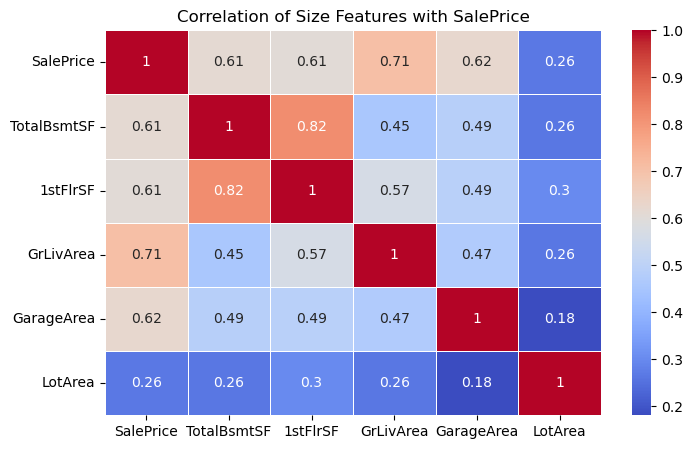

In [30]:
# size-related features
size_features = ["SalePrice", "TotalBsmtSF", "1stFlrSF", "GrLivArea", "GarageArea", "LotArea"]
corr_matrix = df2[size_features].corr()

# Plot heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation of Size Features with SalePrice")
plt.show()


In [31]:
# Total square footage including basement
df["TotalSF"] = df["TotalBsmtSF"] + df["1stFlrSF"]

# Total number of bathrooms including half-baths
df["TotalBathrooms"] = df["FullBath"] + (0.5 * df["HalfBath"]) + df["BsmtFullBath"]

# Total Porch area
df["TotalPorchSF"] = df["OpenPorchSF"]

# Garage Size Efficiency-size per car space
df["GarageEfficiency"] = df["GarageArea"] / (df["GarageCars"] + 1)

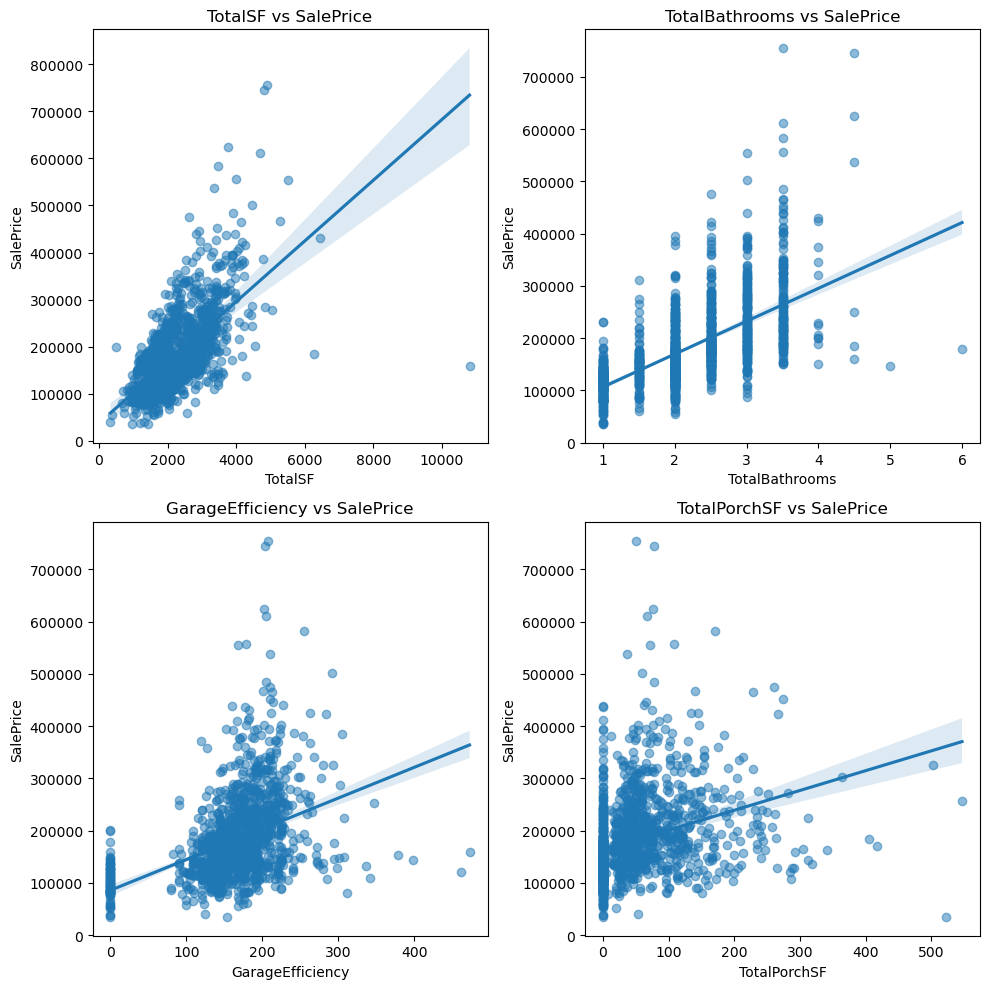

In [32]:
fig, axes = plt.subplots(2, 2, figsize=(10,10))

sns.regplot(x="TotalSF", y="SalePrice", data=df, scatter_kws={'alpha':0.5}, ax=axes[0, 0])
axes[0, 0].set_title("TotalSF vs SalePrice")

sns.regplot(x="TotalBathrooms", y="SalePrice", data=df, scatter_kws={'alpha':0.5}, ax=axes[0, 1])
axes[0, 1].set_title("TotalBathrooms vs SalePrice")

sns.regplot(x="GarageEfficiency", y="SalePrice", data=df, scatter_kws={'alpha':0.5}, ax=axes[1, 0])
axes[1, 0].set_title("GarageEfficiency vs SalePrice")

sns.regplot(x="TotalPorchSF", y="SalePrice", data=df, scatter_kws={'alpha':0.5}, ax=axes[1, 1])
axes[1, 1].set_title("TotalPorchSF vs SalePrice")

plt.tight_layout()
plt.show()

### 7. Market Trends and Historical Pricing:

● Task: Explore historical pricing trends over time and understand market influences.

● Python Library: Matplotlib, Seaborn

● Explanation: Analyze the dataset temporally, looking at trends in house prices over different periods. Understand how external factors, such as economic indicators, may have influenced these trends.

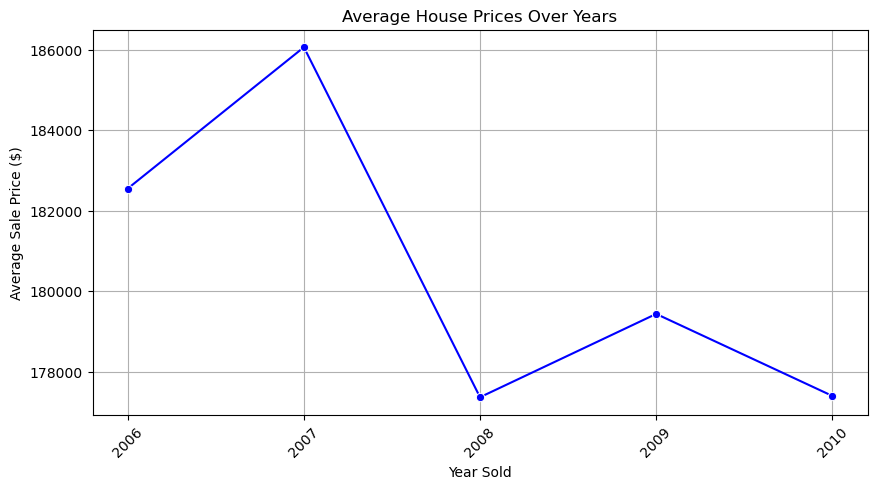

In [33]:
# Group by Year Sold and sale price
yearly_avg_price = df2.groupby("YrSold")["SalePrice"].mean()

# Plot
plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_avg_price.index, y=yearly_avg_price.values, marker="o", linestyle="-", color="blue")
plt.title("Average House Prices Over Years")
plt.xlabel("Year Sold")
plt.ylabel("Average Sale Price ($)")
plt.xticks(yearly_avg_price.index, rotation=45) 
plt.grid()
plt.show()

C:\Users\dewan\AppData\Local\Temp\ipykernel_29748\4153141369.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Day'] = 1
C:\Users\dewan\AppData\Local\Temp\ipykernel_29748\4153141369.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Year'] = data['YrSold']
C:\Users\dewan\AppData\Local\Temp\ipykernel_29748\4153141369.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

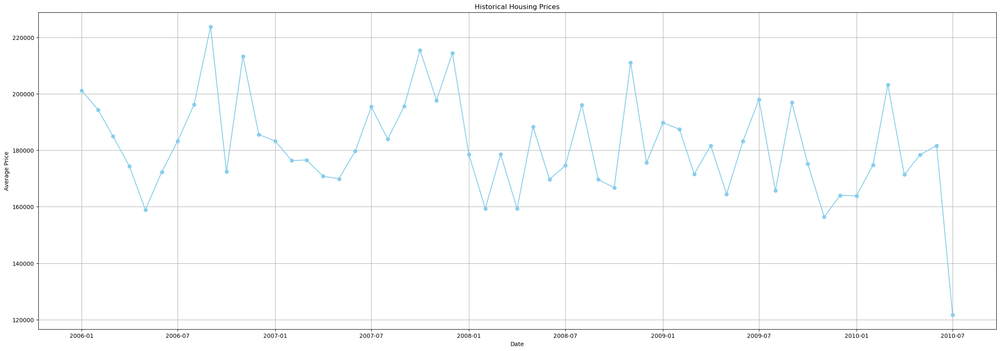

In [34]:
# Correcting the data selection and column names


data = df2[['MoSold', 'YrSold', 'SalePrice']]
data['Day'] = 1 
data['Year'] = data['YrSold']
data['Month'] = data['MoSold'].copy()
data['Date'] = pd.to_datetime(data[['Year', 'Month', 'Day']])

data = data.drop(columns=['Day'])
df_grouped = data.groupby('Date')['SalePrice'].mean().reset_index()
df_grouped.rename(columns={'SalePrice': 'Price'}, inplace=True)

# Plotting the historical housing prices
plt.figure(figsize=(30, 10))
plt.plot(df_grouped['Date'], df_grouped['Price'], marker='o', linestyle='-', color='skyblue')

plt.title('Historical Housing Prices')
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.grid()
plt.show()

### 8. Customer Preferences and Amenities:

● Task: Investigate how customer preferences and amenities impact house prices.

● Python Library: Matplotlib, Seaborn

● Explanation: Examine the dataset to understand how specific amenities (e.g., swimming pool, garage) impact house prices. Analyze customer feedback or reviews to gauge the perceived value of these amenities

In [35]:
df2.columns


Index(['Unnamed: 0', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'Pa

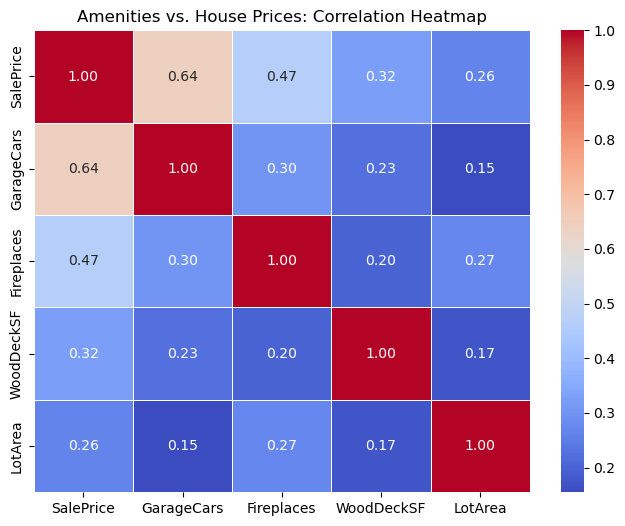

In [36]:
amenity_features = ["SalePrice", "GarageCars", "Fireplaces", "WoodDeckSF", "LotArea"]

# Check the existing features
existing_features = [col for col in amenity_features if col in df2.columns]
corr_matrix = df2[existing_features].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f")
plt.title("Amenities vs. House Prices: Correlation Heatmap")
plt.show()

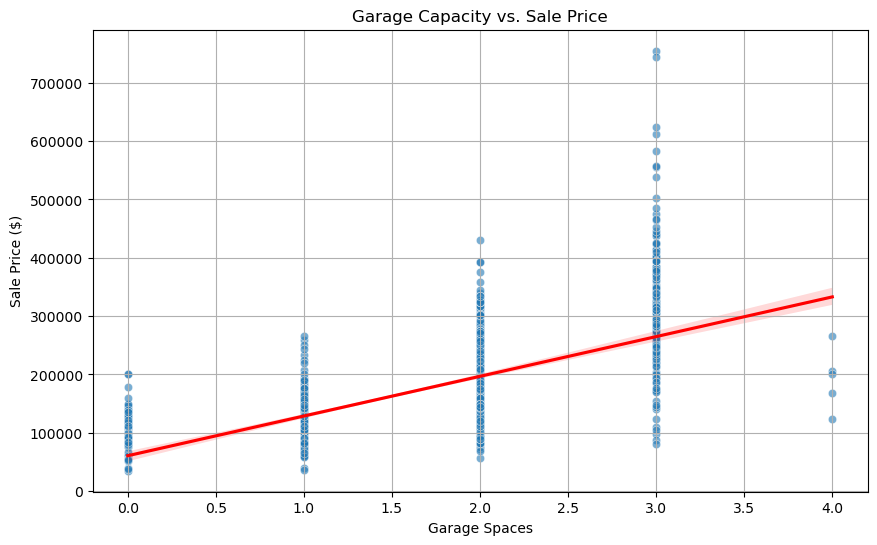

In [37]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df2["GarageCars"], y=df2["SalePrice"], alpha=0.6)
sns.regplot(x=df2["GarageCars"], y=df2["SalePrice"], scatter=False, color="red")
plt.title("Garage Capacity vs. Sale Price")
plt.xlabel("Garage Spaces")
plt.ylabel("Sale Price ($)")
plt.grid()
plt.show()